In [1]:
import os
import sys
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

from zipfile import ZipFile
from urllib.request import urlretrieve

from IPython.display import HTML
from matplotlib.animation import FuncAnimation

from IPython.display import YouTubeVideo, display, HTML
from base64 import b64encode

%matplotlib inline

In [2]:
def download_and_unzip(url, save_path):
    print(f"Downloading and extracting assests....", end="")

    # Downloading zip file using urllib package.
    urlretrieve(url, save_path)

    try:
        # Extracting zip file using the zipfile package.
        with ZipFile(save_path) as z:
            # Extract ZIP file contents in the same directory.
            z.extractall(os.path.split(save_path)[0])

        print("Done")

    except Exception as e:
        print("\nInvalid file.", e)
URL = r"https://www.dropbox.com/s/xoomeq2ids9551y/opencv_bootcamp_assets_NB13.zip?dl=1"

asset_zip_path = os.path.join(os.getcwd(), f"opencv_bootcamp_assets_NB13.zip")

# Download if assest ZIP does not exists.
if not os.path.exists(asset_zip_path):
    download_and_unzip(URL, asset_zip_path)

## Load COCO Class Labels

The COCO dataset contains 80 different object classes. We need to load these class labels to map the network's output predictions to human-readable class names.

- **classFile**: Path to the text file containing all COCO class labels
- **labels**: List containing all class names (person, bicycle, car, motorcycle, etc.)
- **fp.read().split("\\n")**: Reads the entire file and splits it by newlines to create a list

Each line in the file represents one class label, and the index position corresponds to the class ID that the neural network will output. For example:
- Index 0: person
- Index 1: bicycle  
- Index 2: car
- And so on...

In [3]:
classFile  = "Models/coco_class_labels.txt"
with open(classFile) as fp:
    labels = fp.read().split("\n")

print(labels)

['unlabeled', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'street sign', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'hat', 'backpack', 'umbrella', 'shoe', 'eye glasses', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'plate', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'mirror', 'dining table', 'window', 'desk', 'toilet', 'door', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'blender', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush', 'hair brush', '']


## Load Pre-trained Neural Network Model

We're using a pre-trained SSD MobileNet v2 model that was trained on the COCO dataset. This model requires two files:

- **modelFile (.pb)**: The frozen inference graph containing the pre-trained weights and model parameters
- **configFile (.pbtxt)**: The configuration file containing the model architecture and layer definitions

### Model Details:
- **Architecture**: SSD (Single Shot MultiBox Detector) with MobileNet v2 backbone
- **Framework**: TensorFlow (loaded via OpenCV's DNN module)
- **Training Data**: COCO dataset (Common Objects in Context)
- **Input Size**: 300x300 pixels
- **Output**: Bounding boxes, class predictions, and confidence scores

The difference between the two files:
- **.pb file**: Contains the actual neural network weights and computational graph
- **.pbtxt file**: Contains the text-based model architecture description that OpenCV uses to understand the network structure

**cv.dnn.readNetFromTensorflow()** loads both files and creates a network object that we can use for inference.

In [4]:
modelFile  = os.path.join("models", "ssd_mobilenet_v2_coco_2018_03_29", "frozen_inference_graph.pb")
configFile = os.path.join("models", "ssd_mobilenet_v2_coco_2018_03_29.pbtxt")
# Read the Tensorflow network
net = cv.dnn.readNetFromTensorflow(modelFile, configFile)

## Object Detection Function

The `detect_objects()` function performs the core object detection inference. Here's how it works:

### Input Preprocessing:
- **cv.dnn.blobFromImage()**: Converts the input image into a 4D blob format required by the neural network
  - **Scale factor (1.0)**: No scaling applied to pixel values
  - **Size (dim, dim)**: Resizes image to 300x300 pixels (default model input size)
  - **Mean (0, 0, 0)**: No mean subtraction applied
  - **swapRB=True**: Swaps Red and Blue channels (converts BGR to RGB)
  - **crop=False**: Resizes without cropping, may change aspect ratio

### Neural Network Inference:
- **net.setInput(blob)**: Feeds the preprocessed image blob to the network
- **net.forward()**: Performs forward pass through the neural network
- **objects**: Returns a 4D array containing all detected objects with their properties

### Output Format:
The returned `objects` array has shape (1, 1, N, 7) where:
- N = number of detected objects
- Each detection contains 7 values: [batch_id, class_id, confidence, x1, y1, x2, y2]
- Coordinates are normalized (0.0 to 1.0) relative to the input image dimensions

In [5]:
# For ach file in the directory
def detect_objects(net, im, dim = 300):

    # Create a blob from the image
    blob = cv.dnn.blobFromImage(im, 1.0, size=(dim, dim), mean=(0, 0, 0), swapRB=True, crop=False)

    # Pass blob to the network
    net.setInput(blob)

    # Peform Prediction
    objects = net.forward()
    return objects

In [6]:
FONTFACE = cv.FONT_HERSHEY_SIMPLEX
FONT_SCALE = 0.7
THICKNESS = 1

In [7]:
def display_text(im, text, x, y):
    # Get text size
    textSize = cv.getTextSize(text, FONTFACE, FONT_SCALE, THICKNESS)
    dim = textSize[0]
    baseline = textSize[1]

    # Use text size to create a black rectangle
    cv.rectangle(
        im,
        (x, y - dim[1] - baseline),
        (x + dim[0], y + baseline),
        (0, 0, 0),
        cv.FILLED,
    )

    # Display text inside the rectangle
    cv.putText(
        im,
        text,
        (x, y - 5),
        FONTFACE,
        FONT_SCALE,
        (0, 255, 255),
        THICKNESS,
        cv.LINE_AA,
    )

In [8]:
def display_objects(im, objects, threshold=0.25):
    rows = im.shape[0]
    cols = im.shape[1]

    # For every Detected Object
    for i in range(objects.shape[2]):
        # Find the class and confidence
        classId = int(objects[0, 0, i, 1])
        score = float(objects[0, 0, i, 2])

        # Recover original cordinates from normalized coordinates
        x = int(objects[0, 0, i, 3] * cols)
        y = int(objects[0, 0, i, 4] * rows)
        w = int(objects[0, 0, i, 5] * cols - x)
        h = int(objects[0, 0, i, 6] * rows - y)

        # Check if the detection is of good quality
        if score > threshold:
            display_text(im, "{}".format(labels[classId]), x, y)
            cv.rectangle(im, (x, y), (x + w, y + h), (255, 255, 255), 2)

    # Convert Image to RGB since we are using Matplotlib for displaying image
    mp_img = cv.cvtColor(im, cv.COLOR_BGR2RGB)
    plt.figure(figsize=(30, 10))
    plt.imshow(mp_img)
    plt.show()

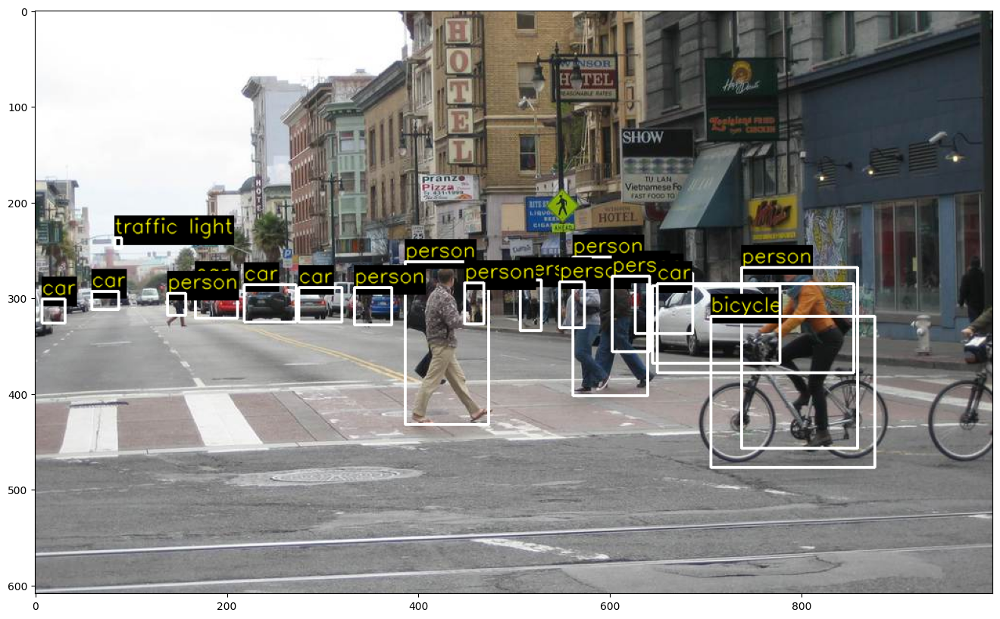

In [9]:
im = cv.imread(os.path.join("Photos", "street.jpg"))
objects = detect_objects(net, im)
display_objects(im, objects)

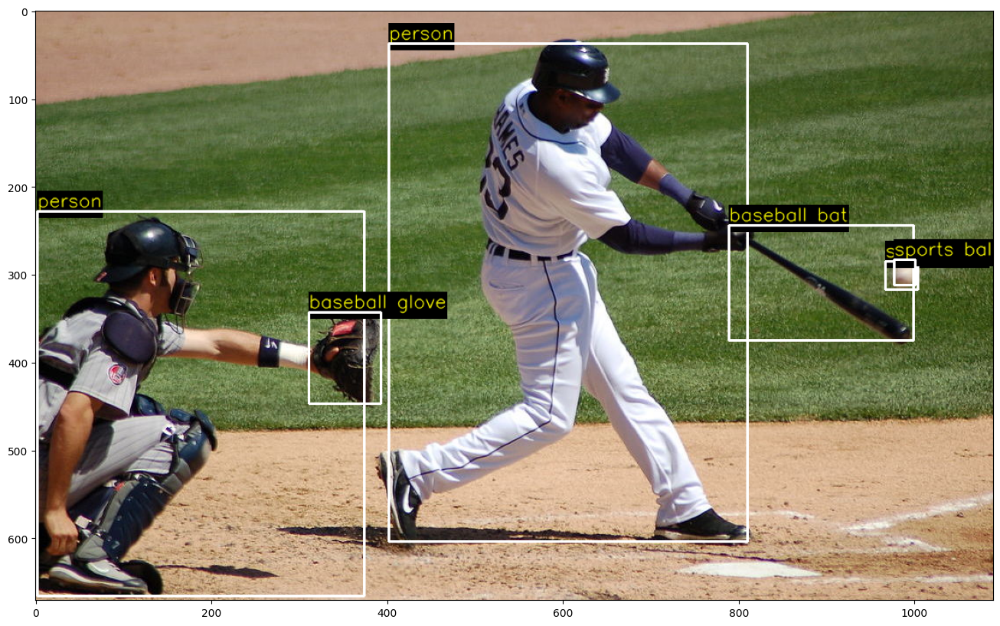

In [10]:
im = cv.imread(os.path.join("Photos", "baseball.jpg"))
objects = detect_objects(net, im)
display_objects(im, objects, 0.2)

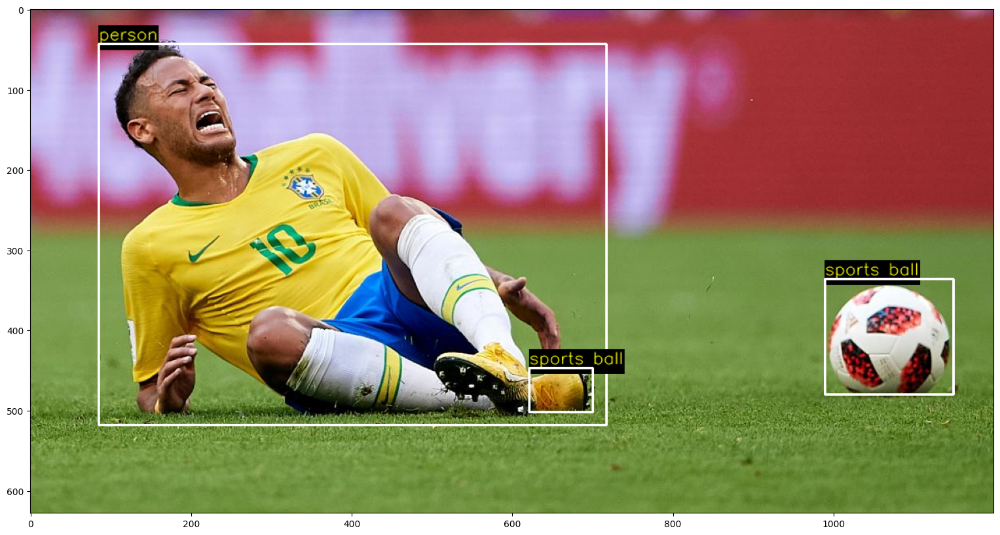

In [11]:
im = cv.imread(os.path.join("Photos", "soccer.jpg"))
objects = detect_objects(net, im)
display_objects(im, objects)

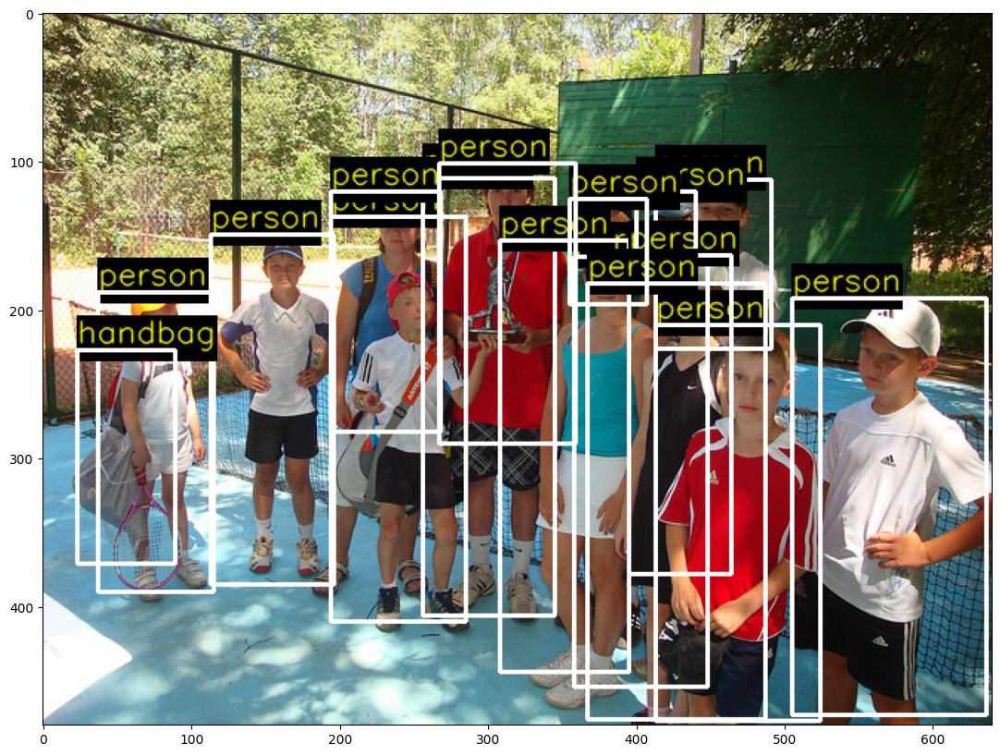

In [12]:
im = cv.imread(os.path.join("Photos", "000000001000.jpg"))
objects = detect_objects(net, im)
display_objects(im, objects)

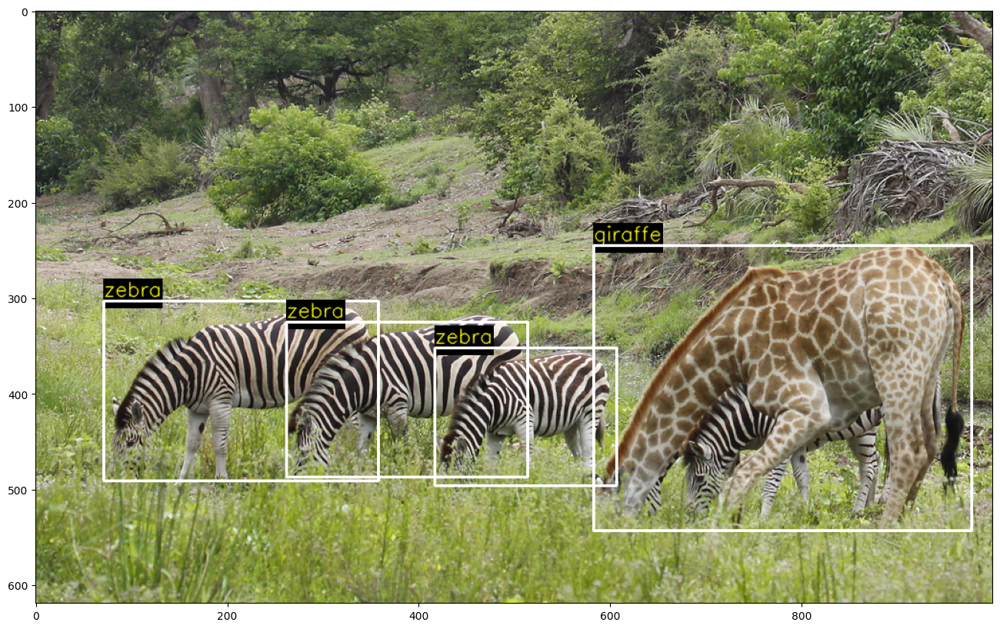

In [13]:
im = cv.imread(os.path.join("Photos", "giraffe-zebra.jpg"))
objects = detect_objects(net, im)
display_objects(im, objects)